In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from numpy import dot, exp, mgrid, pi, ravel, square, uint8, zeros
from itertools import product
from scipy.signal import convolve2d
import math
import warnings
warnings.filterwarnings('ignore')

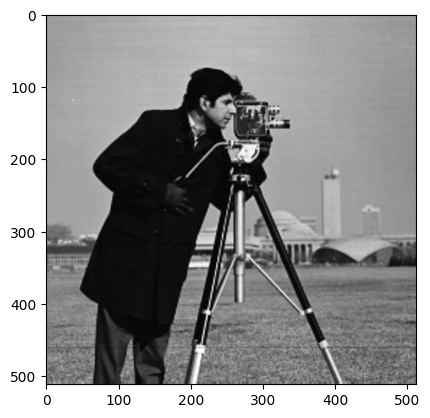

In [2]:
# Read the image using OpenCV
image = cv2.imread('../lab1/standard_test_images/cameraman.tif', flags=cv2.IMREAD_GRAYSCALE)
# image2 = cv2.imread('peppers_gray.tif')
# image3 = cv2.imread('mandril_gray.tif')
plt.imshow(image, cmap='gray')

In [3]:
def normalized_histogram(image):
    m, n = image.shape
    histogram = [0.0] * 256
    for i in range(m):
        for j in range(n):
            histogram[image[i, j]] += 1
    return np.array(histogram) / (m * n)

def cumsum(histogram):
    return [sum(histogram[:i + 1]) for i in range(len(histogram))]

def histogram_equalization(input_image):
    original_histogram = normalized_histogram(input_image)
    cdf = np.array(cumsum(original_histogram))
    func = np.uint8(255 * cdf)
    s1, s2 = input_image.shape
    output_image = np.zeros_like(input_image)
    for i in range(0, s1):
        for j in range(0, s2):
            output_image[i, j] = func[input_image[i, j]]
    new_histogram = normalized_histogram(output_image)
    return output_image, original_histogram, new_histogram, func

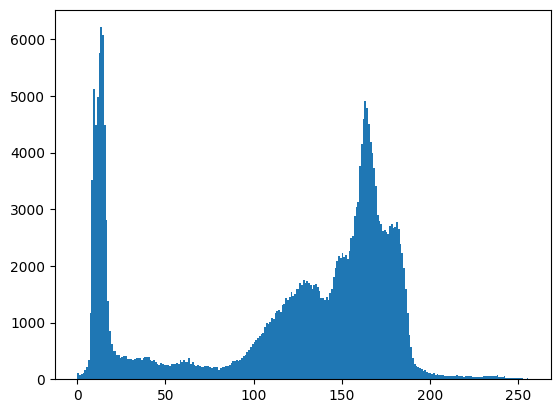

In [4]:
plt.hist(image.ravel(), 256, [0, 256])
plt.show()

In [5]:
def MSE(img1, img2):
    height, width = img1.shape[:2]

    squared_error = 0.0
    for y in range(height):
        for x in range(width):
            squared_error += (img1[y, x] - img2[y, x]) ** 2

    mse = squared_error / (height * width)
    return mse


In [6]:
def PSNR(original_image, processed_image, gray_scale=False):
#     original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
#     processed_image = cv2.cvtColor(processed_image, cv2.COLOR_BGR2GRAY)
    return 10 * math.log(pow(255,2) / MSE(original_image, processed_image) ,10)

In [7]:
def SSIM(original_image, processed_image, C1, C2, gray_scale=False):
    orig_arr = np.asarray(original_image, dtype=float)
    proc_arr = np.asarray(processed_image, dtype=float)

    o_mean = np.mean(orig_arr)
    p_mean = np.mean(proc_arr)

    o_std = np.std(orig_arr)
    p_std = np.std(proc_arr)

    i_w, i_h = orig_arr.shape[:2]

    e = np.sum((orig_arr - o_mean) * (proc_arr - p_mean))

    cov = e / (i_w * i_h)

    luminance = (2 * o_mean * p_mean + C2)/ (o_mean**2 + p_mean**2 + C2)
    contrast = (2 * o_std * p_std + C2)/ (o_std**2 + p_std**2 + C2)
    struct = (cov + C2/2) / (o_std * p_std + C2/2)
    
    result = luminance * contrast * struct
    
    return result

In [8]:
def ME(original_image, processed_image):
#     original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
#     processed_image = cv2.cvtColor(processed_image, cv2.COLOR_BGR2GRAY)
    num = 0
    for i in range(original_image.shape[0]):
        for j in range(original_image.shape[1]):
            if original_image[i,j] != processed_image[i,j]:
                num += 1
    ME = num / (original_image.shape[0] * original_image.shape[1])
    return ME

In [9]:
def RAE(original_image, processed_image):
    _, binary_image1 = cv2.threshold(original_image, 0, 255, cv2.THRESH_BINARY)
    _, binary_image2 = cv2.threshold(processed_image, 0, 255, cv2.THRESH_BINARY)
    RAE = np.abs(np.sum(binary_image1) - np.sum(binary_image2)) / np.sum(binary_image1)
    return RAE

## FILTERS

In [10]:
def linear_blur(image, angle, length):
    angle = angle * np.pi / 180.0
    proj_x = length * np.cos(angle)
    proj_y = length * np.sin(angle)
    height, width = image.shape
    output_image = np.zeros((height, width))
    for y in range(height):
        for x in range(width):
            start_x = int(x - proj_x / 2)
            start_y = int(y - proj_y / 2)
            end_x = int(x + proj_x / 2)
            end_y = int(y + proj_y / 2)
            if start_x < 0:
                start_x = 0
            if start_y < 0:
                start_y = 0
            if end_x >= width:
                end_x = width - 1
            if end_y >= height:
                end_y = height - 1
            blur_region = image[start_y:end_y+1, start_x:end_x+1]
            blur_value = np.mean(blur_region)
            output_image[y, x] = blur_value
    return output_image

In [11]:
def box_filter(image, size):
    filtered_image = np.zeros_like(image)
    kernel = np.ones((size, size), np.float32) / (size*size)
    padded_image = cv2.copyMakeBorder(image, size//2, size//2, size//2, size//2, cv2.BORDER_REPLICATE)
    for i in range(size//2, image.shape[0] + size//2):
        for j in range(size//2, image.shape[1] + size//2):
            patch = padded_image[i-size//2:i+size//2+1, j-size//2:j+size//2+1]
            filtered_image[i-size//2, j-size//2] = np.sum(patch * kernel)
    return filtered_image

In [12]:
def inverse_filter(image, psf, eps=1e-3):
    fft_image = np.fft.fft2(image)
    fft_psf = np.fft.fft2(psf, s=image.shape)
    kernel = np.conj(fft_psf) / (np.abs(fft_psf)**2 + eps)
    restored_image = np.fft.ifft2(fft_image * kernel)
    restored_image = np.real(restored_image)
    return np.clip(restored_image, 0, 255).astype(np.uint8)
psf = np.ones((3, 3)) / 9

In [13]:
def inverse_filter_blur(image, psf, epsilon=1e-8):
    H = np.fft.fft2(psf, s=image.shape)
    G = np.fft.fft2(image)
    F_hat = np.divide(G, H + epsilon)
    f_hat = np.fft.ifft2(F_hat).real
    f_hat = np.clip(f_hat, 0, 255).astype(np.uint8)
    return f_hat

def create_psf(sigma):
    size = int(2*np.ceil(3*sigma)+1)
    x = np.linspace(-size/2, size/2, size)
    kernel = np.exp(-(x**2)/(2*sigma**2))
    psf = np.outer(kernel, kernel)
    psf /= psf.sum()
    return psf

psf = create_psf(0.1)

In [14]:
def wiener_filter(img, K=0.0000001):
    kernel_size = 5
    kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size * kernel_size)
    noise_var = np.var(img)    
    img_fft = np.fft.fft2(img)
    kernel_fft = np.fft.fft2(kernel, s=img.shape)
    kernel_fft_conj = np.conj(kernel_fft)
    kernel_norm = np.abs(kernel_fft) ** 2
    img_fft_filtered = kernel_fft_conj * img_fft / (kernel_norm + K*noise_var/kernel_norm)
    img_filtered = np.real(np.fft.ifft2(img_fft_filtered))
    img_filtered = np.clip(img_filtered, 0, 255)
    img_filtered = img_filtered.astype(np.uint8)
    return img_filtered

In [15]:
def gaussian_kernel(size, sigma):
    kernel = np.zeros((size, size))
    c = size // 2
    coeff = 1 / (2 * np.pi * sigma ** 2)
    for i in range(size):
        for j in range(size):
            kernel[i, j] = coeff * np.exp(-((i-c)**2 + (j-c)**2) / (2 * sigma ** 2))
    kernel /= kernel.sum()
    return kernel

def convolution(img, kernel):
    h, w = img.shape
    kh, kw = kernel.shape
    pad_h, pad_w = kh // 2, kw // 2
    img_pad = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), 'constant')
    filtered_img = np.zeros((h, w))
    for i in range(h):
        for j in range(w):
            filtered_img[i, j] = np.sum(img_pad[i:i+kh, j:j+kw] * kernel)
    return filtered_img

def van_cittert_filter(img, n_iter=5, kernel_size=5, sigma=0.1):
    img = img.astype(float)
    h, w = img.shape
    filtered_img = np.zeros((h, w))
    kernel = gaussian_kernel(kernel_size, sigma)  
    for i in range(n_iter):
        filtered_img = convolution(img, kernel)
        diff = img - filtered_img
        inv_diff = convolution(diff, np.flip(kernel))
        img = img + filtered_img - inv_diff
    img = np.clip(img, 0, 255).astype(np.uint8)
    return img

In [16]:
def richardson_lucy_filter(img, psf, n_iter):
    restored_img = np.ones(img.shape)
    psf_transpose = np.flip(psf)
    for i in range(n_iter):
        est_img = cv2.filter2D(restored_img, -1, psf)
        ratio = img / est_img        
        correction_factor = cv2.filter2D(ratio, -1, psf_transpose)        
        restored_img = restored_img * correction_factor
    return restored_img
psf = np.ones((5, 5)) / 25

In [17]:
def landweber(image, psf, n_iter, alpha):
    x = np.zeros_like(image, dtype=np.float32)
    psf_mirror = np.flip(psf)
    psf_fft = np.fft.fft2(psf_mirror, s=image.shape)
    for i in range(n_iter):
        y = np.fft.ifft2(np.fft.fft2(x) * psf_fft).real
        x += alpha * (image - y)
    x = (x - np.min(x)) / (np.max(x) - np.min(x)) * 255
    return x.astype(np.uint8)

In [18]:
def plot_images(input_image, output_image, input_title, output_title):
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18,5))
    ax[0].imshow(input_image, cmap='gray')
    ax[0].set_title(input_title)
    ax[1].imshow(output_image, cmap='gray')
    ax[1].set_title(output_title)
    ax[2] = plt.hist(output_image.ravel(), 256, [0, 256])
    plt.show()

In [19]:
def evaluation(in_image, out_image):
    # Calculate PSNR, SSIM, ME, RAE
    psnr = PSNR(in_image, out_image)
    ssim = SSIM(in_image, out_image, 0.01, 0.03)
    me = ME(in_image, out_image)
    rae = RAE(in_image, out_image)
    
    print("PSNR: ", psnr)
    print("SSIM: ", ssim)
    print("ME: ", me)
    print("RAE: ", rae)

## Realization

## linear blur

In [20]:
linear_blur_image1 = linear_blur(image, 0, 10)

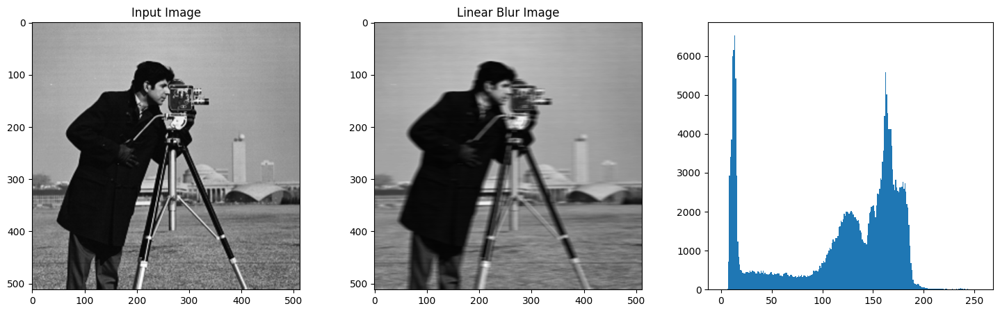

PSNR:  24.53933792005541
SSIM:  0.9687243046698635
ME:  0.98004150390625
RAE:  0.00038925057815159404
Angle = 0
Length = 10


In [21]:
plot_images(image, linear_blur_image1, "Input Image", "Linear Blur Image")
evaluation(image, linear_blur_image1)
print("Angle = 0\nLength = 10")

In [22]:
linear_blur_image2 = linear_blur(image, 45, 20)

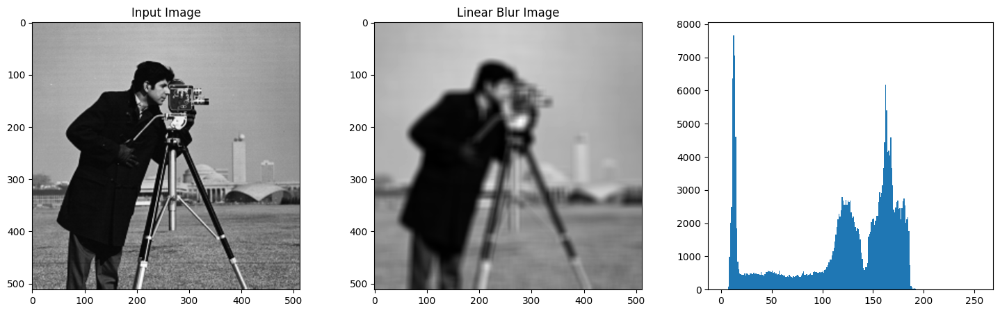

PSNR:  21.662314413814702
SSIM:  0.9367534396938976
ME:  0.9994239807128906
RAE:  0.00038925057815159404
Angle = 45
Length = 20


In [23]:
plot_images(image, linear_blur_image2, "Input Image", "Linear Blur Image")
evaluation(image, linear_blur_image2)
print("Angle = 45\nLength = 20")

In [24]:
linear_blur_image3 = linear_blur(image, 90, 15)

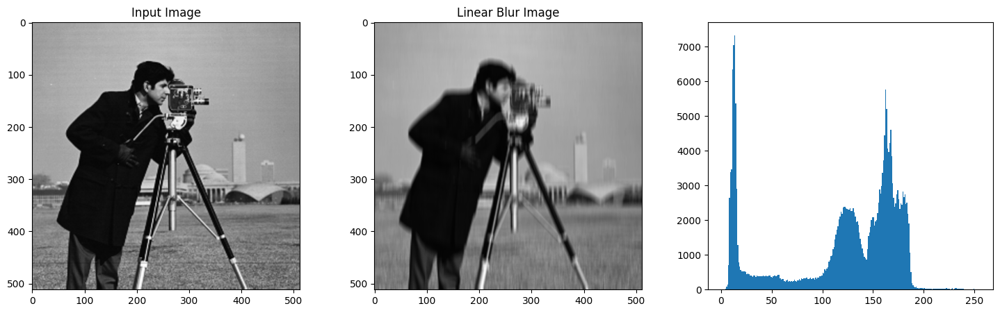

PSNR:  24.943607702035784
SSIM:  0.9715769060900801
ME:  0.9896125793457031
RAE:  0.00038925057815159404
Angle = 90
Length = 15


In [25]:
plot_images(image, linear_blur_image3, "Input Image", "Linear Blur Image")
evaluation(image, linear_blur_image3)
print("Angle = 90\nLength = 15")

#### Built-in Implementation

In [26]:
def linear_blur_cv2(image, angle=0, length=50):
    kernel_size=(8, 8)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)
    M = cv2.getRotationMatrix2D((kernel_size[0]//2, kernel_size[1]//2), angle, 1)
    kernel = cv2.warpAffine(kernel, M, kernel_size)
    kernel = kernel / np.sum(kernel)
    result = cv2.filter2D(image, -1, kernel)
    return result 

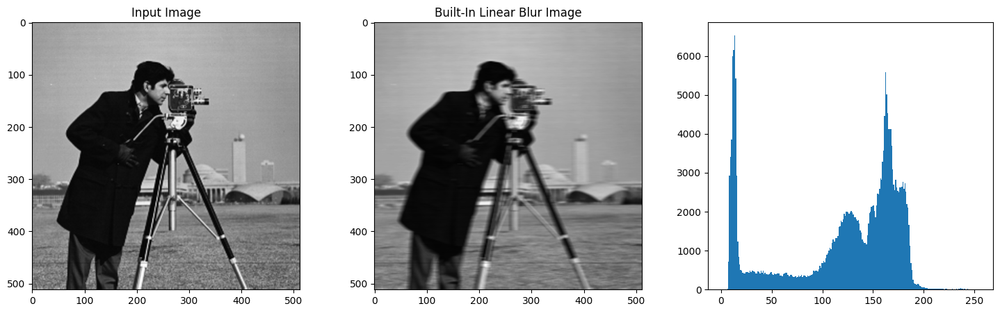

PSNR:  24.53933792005541
SSIM:  0.9687243046698635
ME:  0.98004150390625
RAE:  0.00038925057815159404
Angle = 0
Length = 10


In [27]:
linear_blur_image1_cv2 = linear_blur(image, 0, 10)
plot_images(image, linear_blur_image1_cv2, "Input Image", "Built-In Linear Blur Image")
evaluation(image, linear_blur_image1_cv2)
print("Angle = 0\nLength = 10")

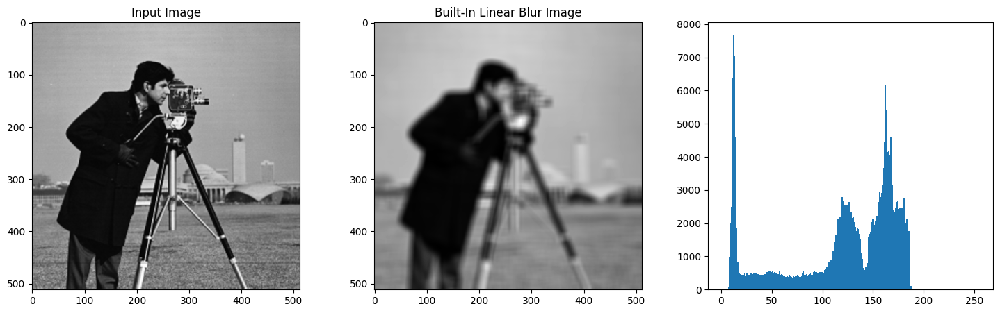

PSNR:  21.662314413814702
SSIM:  0.9367534396938976
ME:  0.9994239807128906
RAE:  0.00038925057815159404
Angle = 45
Length = 20


In [28]:
linear_blur_image2_cv2 = linear_blur(image, 45, 20)
plot_images(image, linear_blur_image2_cv2, "Input Image", "Built-In Linear Blur Image")
evaluation(image, linear_blur_image2_cv2)
print("Angle = 45\nLength = 20")

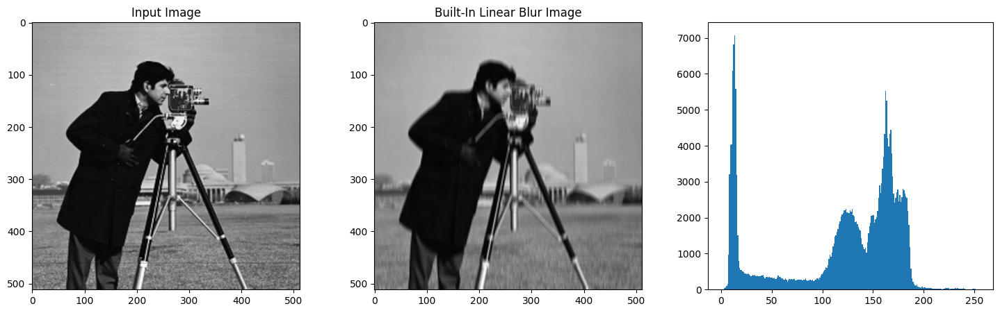

PSNR:  26.882876508988307
SSIM:  0.9820692141310777
ME:  0.9815864562988281
RAE:  0.00038925057815159404
Angle = 90
Length = 10


In [29]:
linear_blur_image3_cv2 = linear_blur(image, 90, 10)
plot_images(image, linear_blur_image3_cv2, "Input Image", "Built-In Linear Blur Image")
evaluation(image, linear_blur_image3_cv2)
print("Angle = 90\nLength = 10")

## box_filter

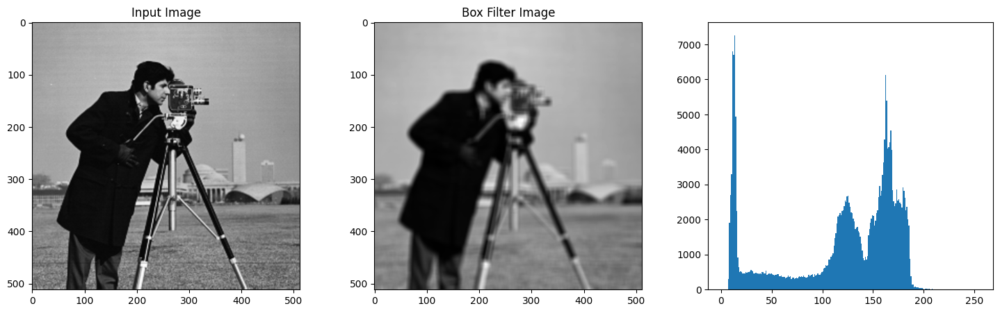

PSNR:  4.573397368955309
SSIM:  0.9571185328867912
ME:  0.864837646484375
RAE:  64.27560087284317
Radius = 11


In [30]:
box_image1 = box_filter(image, 11)
plot_images(image, box_image1, "Input Image", "Box Filter Image")
evaluation(image, box_image1)
print("Radius = 11")

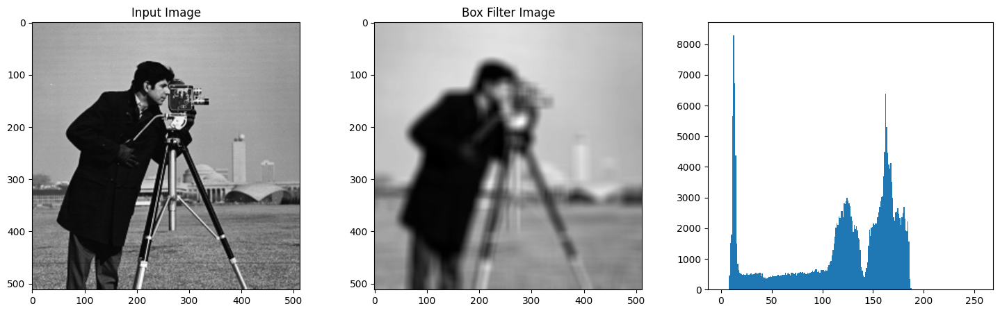

PSNR:  4.363684168764327
SSIM:  0.9206292130777936
ME:  0.8913612365722656
RAE:  64.27560087284317
Radius = 21


In [31]:
box_image2 = box_filter(image, 21)
plot_images(image, box_image2, "Input Image", "Box Filter Image")
evaluation(image, box_image2)
print("Radius = 21")

#### Built-in Implementation

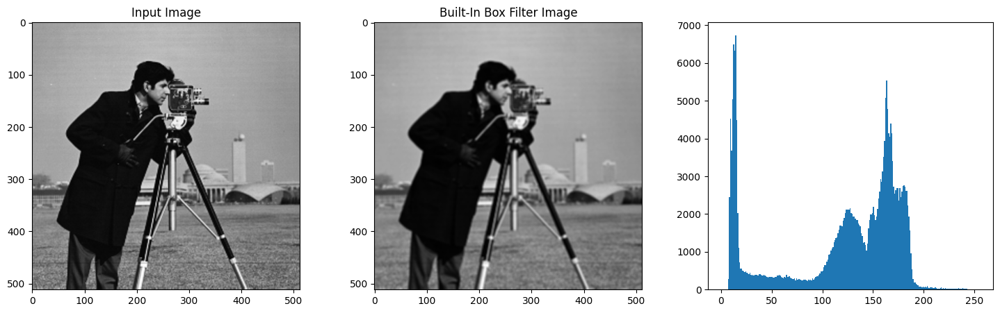

PSNR:  28.925963499256614
SSIM:  0.988820458865593
ME:  0.7715911865234375
RAE:  0.00038925057815159404


In [32]:
box_filter1_cv2 = cv2.boxFilter(image, 11, (5,5), normalize = True)
plot_images(image, box_filter1_cv2, "Input Image", "Built-In Box Filter Image")
evaluation(image, box_filter1_cv2)

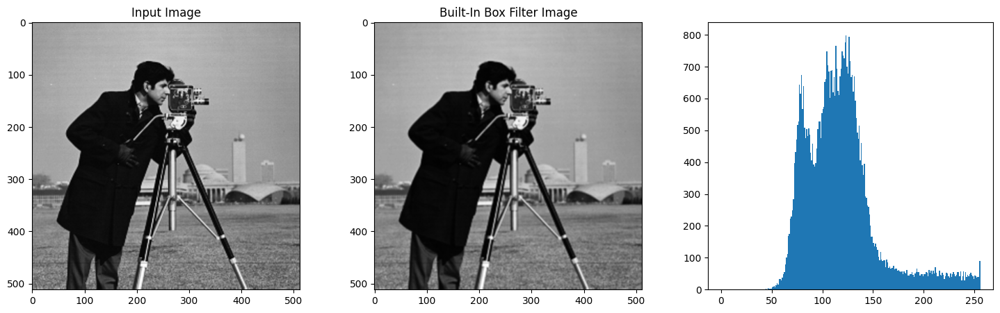

PSNR:  -12.414901516098222
SSIM:  0.04877451123998195
ME:  1.0
RAE:  0.00038925057815159404


In [33]:
box_filter2_cv2 = cv2.boxFilter(image, 21, (3,3), normalize=False)
plot_images(image, box_filter2_cv2, "Input Image", "Built-In Box Filter Image")
evaluation(image, box_filter2_cv2)

In [34]:
linear_blur_images = [linear_blur_image1, linear_blur_image2, linear_blur_image3, #linear blur custom 
                      linear_blur_image1_cv2, linear_blur_image2_cv2, linear_blur_image3_cv2] #linear blur lib
          
box_filter_images = [box_image1, box_image2, # blur custom
                     box_filter1_cv2, box_filter2_cv2] # blur lib

## inverse_filter

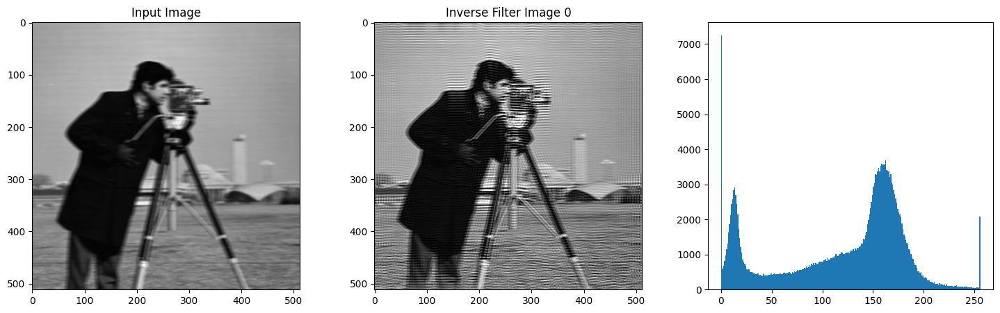

PSNR:  18.823247247656493
SSIM:  0.8865129063889523
ME:  0.9967689514160156
RAE:  0.027675628662109375


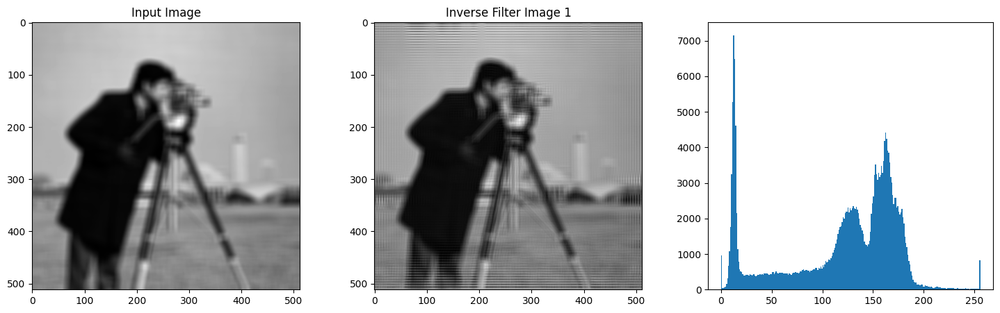

PSNR:  25.064792491289765
SSIM:  0.9686963928977533
ME:  0.9995498657226562
RAE:  0.00370025634765625


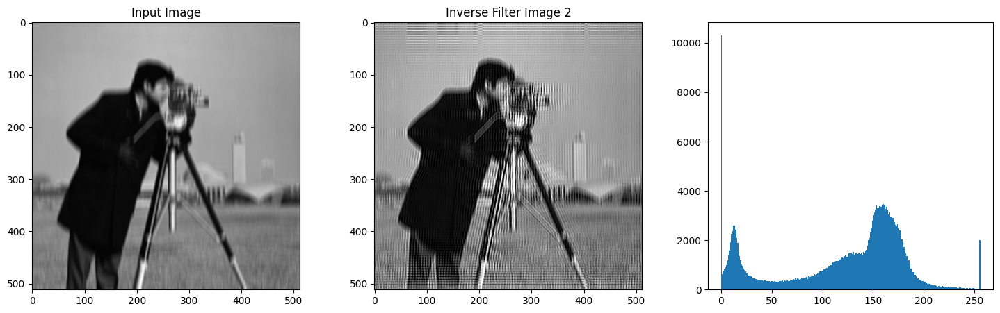

PSNR:  18.749473085462437
SSIM:  0.8836958060402766
ME:  0.9973411560058594
RAE:  0.039348602294921875


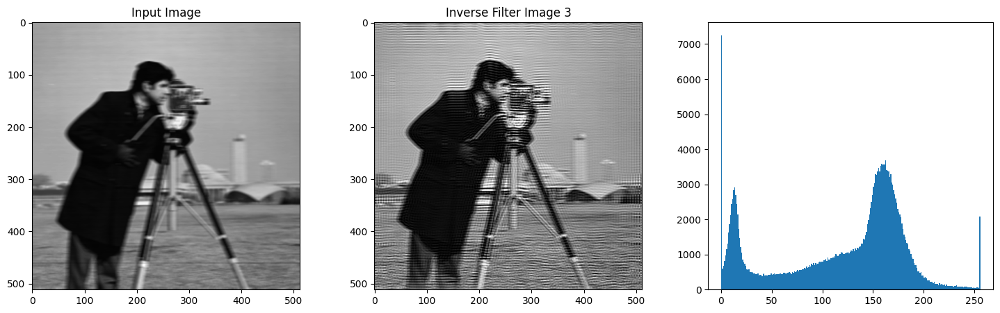

PSNR:  18.823247247656493
SSIM:  0.8865129063889523
ME:  0.9967689514160156
RAE:  0.027675628662109375


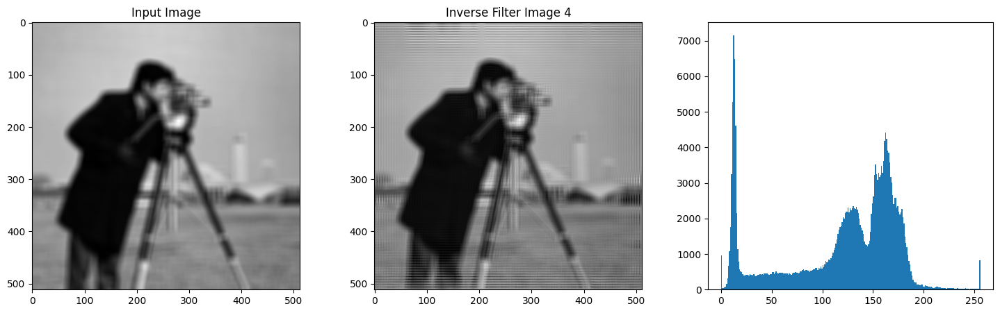

PSNR:  25.064792491289765
SSIM:  0.9686963928977533
ME:  0.9995498657226562
RAE:  0.00370025634765625


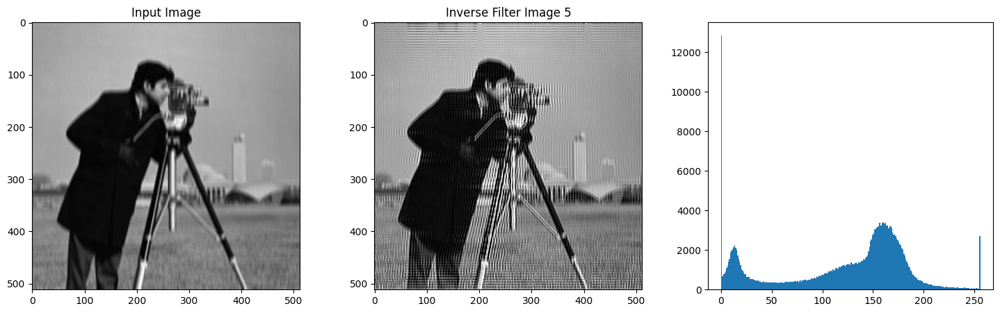

PSNR:  17.683334342528056
SSIM:  0.8573192373068999
ME:  0.9965705871582031
RAE:  0.049106597900390625


In [35]:
for x in range(len(linear_blur_images)):
    inverse_filter_image = inverse_filter(linear_blur_images[x], psf)
    plot_images(linear_blur_images[x], inverse_filter_image, "Input Image", "Inverse Filter Image {}".format(x))
    evaluation(linear_blur_images[x], inverse_filter_image)

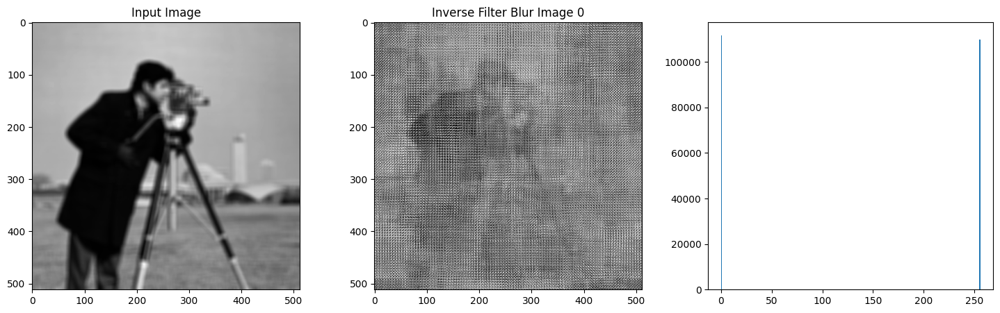

PSNR:  5.5797648378651274
SSIM:  0.06723949349017137
ME:  0.9994049072265625
RAE:  0.42621612548828125


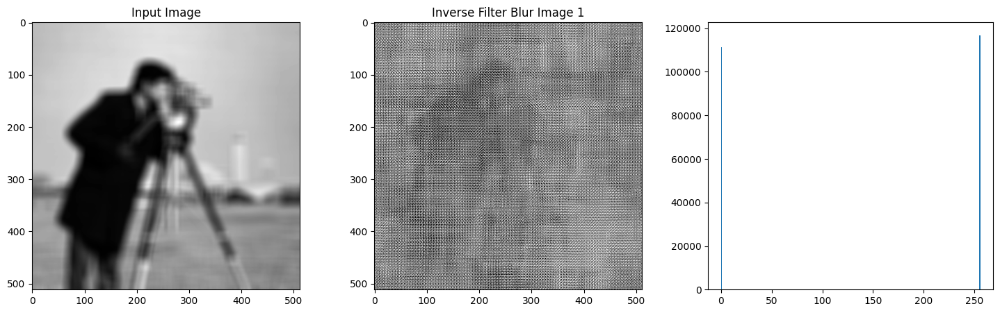

PSNR:  5.658600349674584
SSIM:  0.04997240103605584
ME:  0.9995574951171875
RAE:  0.42421722412109375


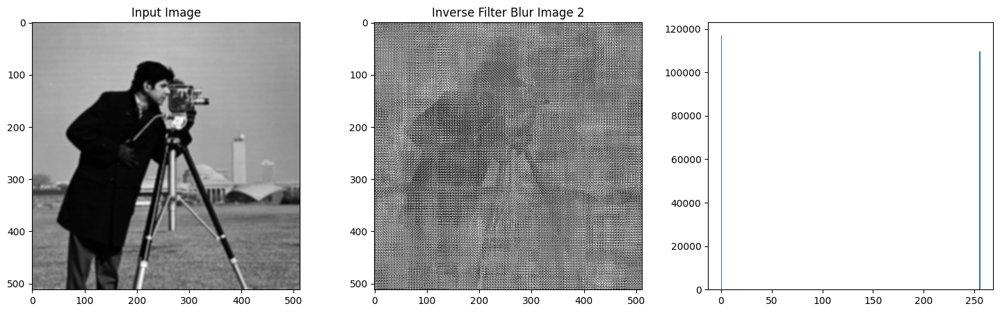

PSNR:  5.7269356878901885
SSIM:  0.05454154293863425
ME:  0.9994354248046875
RAE:  0.446746826171875


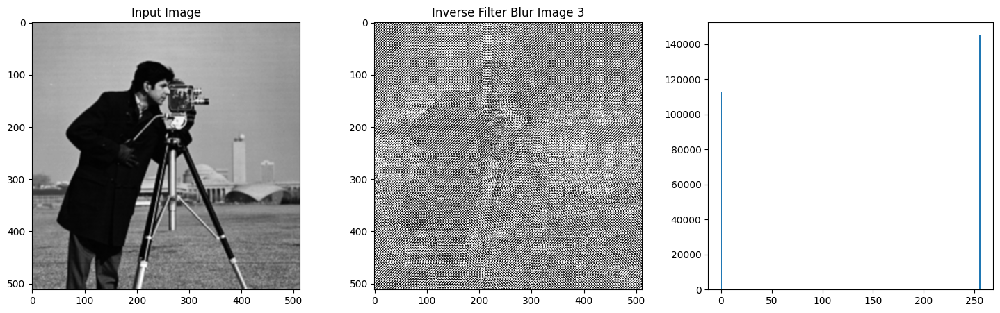

PSNR:  -12.508753134504984
SSIM:  0.007208377595313633
ME:  0.999908447265625
RAE:  0.4304618835449219


In [36]:
for x in range(len(box_filter_images)):
    inverse_filter_blur_image = inverse_filter_blur(box_filter_images[x], psf)
    plot_images(box_filter_images[x], inverse_filter_blur_image, "Input Image", "Inverse Filter Blur Image {}".format(x))
    evaluation(box_filter_images[x], inverse_filter_blur_image)

#### Built-in Implementation

In [37]:
def inverse_filter_cv2(img):
    kernel_size = 5
    sigma = 0.0000001
    kernel = cv2.getGaussianKernel(kernel_size, sigma)
    kernel = np.outer(kernel, kernel.transpose())
    restored = cv2.filter2D(img, -1, kernel[::-1,::-1])
    return restored

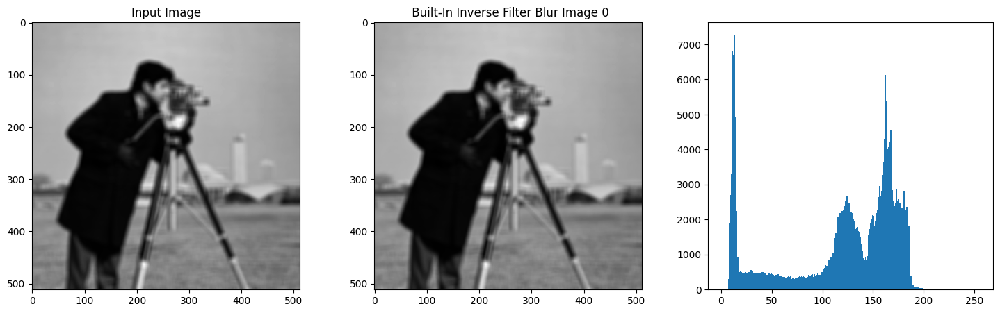

PSNR:  inf
SSIM:  1.0000000000000002
ME:  0.0
RAE:  0.0


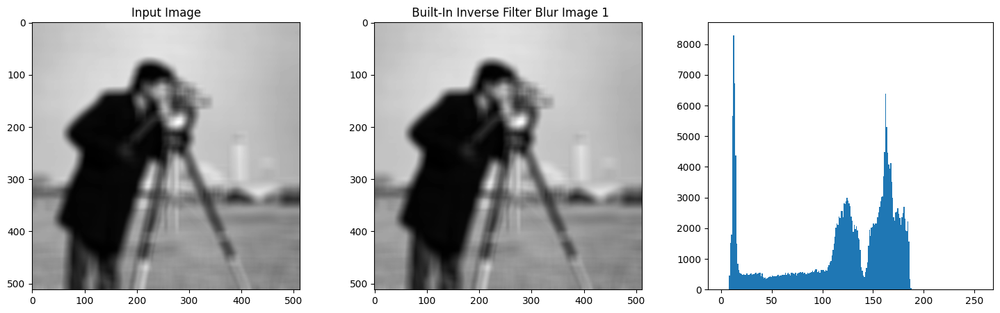

PSNR:  inf
SSIM:  1.0
ME:  0.0
RAE:  0.0


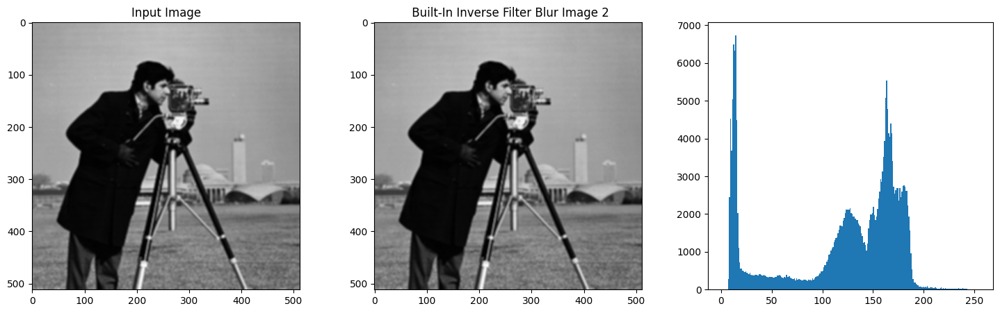

PSNR:  inf
SSIM:  0.9999999999999999
ME:  0.0
RAE:  0.0


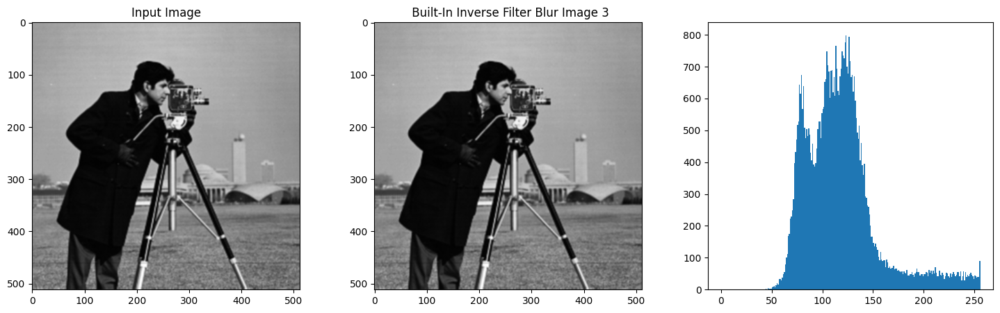

PSNR:  inf
SSIM:  0.9999999999999998
ME:  0.0
RAE:  0.0


In [38]:
for x in range(len(box_filter_images)):
    inverse_filter_blur_image = inverse_filter_cv2(box_filter_images[x])
    plot_images(box_filter_images[x], inverse_filter_blur_image, "Input Image", " Built-In Inverse Filter Blur Image {}".format(x))
    evaluation(box_filter_images[x], inverse_filter_blur_image)

## wiener_filter

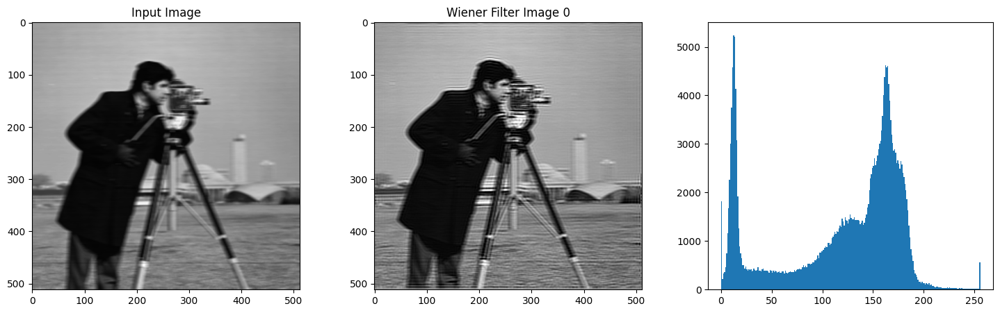

PSNR:  22.463185636044546
SSIM:  0.9483544461752216
ME:  0.9908523559570312
RAE:  0.0069427490234375


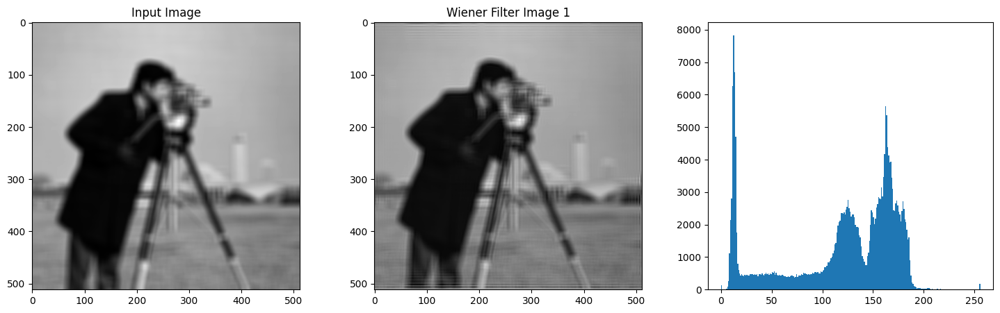

PSNR:  28.670822932742382
SSIM:  0.9861965966462816
ME:  0.9991912841796875
RAE:  0.00052642822265625


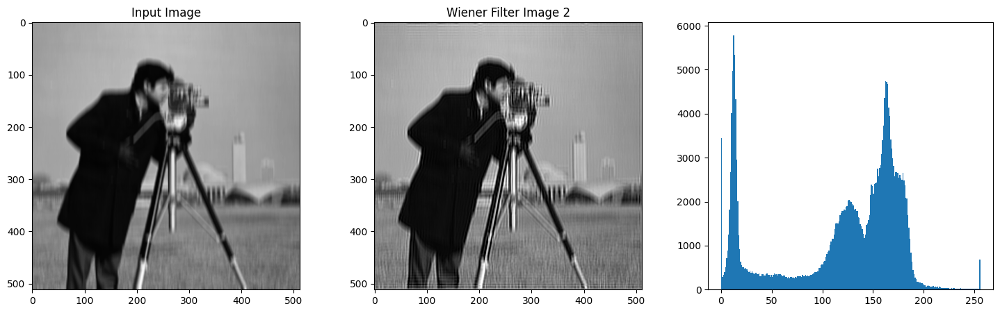

PSNR:  21.687768332372507
SSIM:  0.9385591717512026
ME:  0.9924545288085938
RAE:  0.01314544677734375


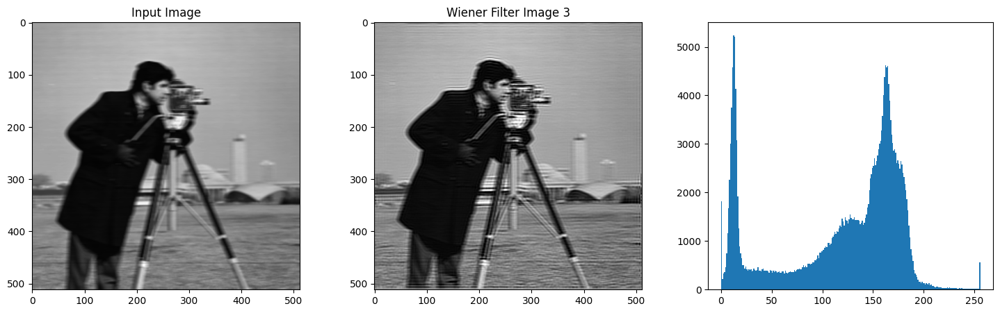

PSNR:  22.463185636044546
SSIM:  0.9483544461752216
ME:  0.9908523559570312
RAE:  0.0069427490234375


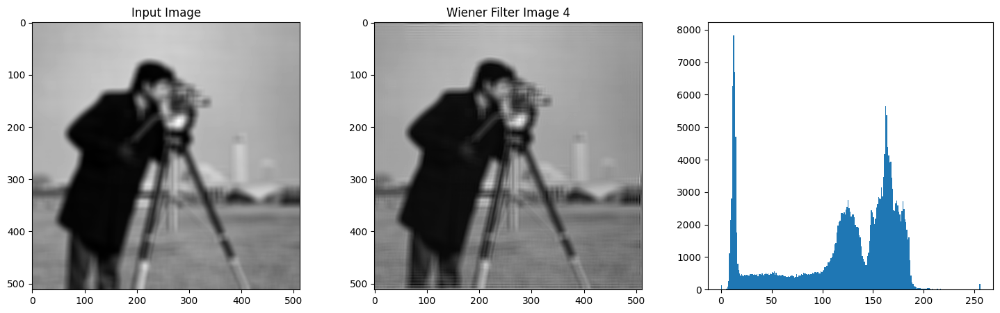

PSNR:  28.670822932742382
SSIM:  0.9861965966462816
ME:  0.9991912841796875
RAE:  0.00052642822265625


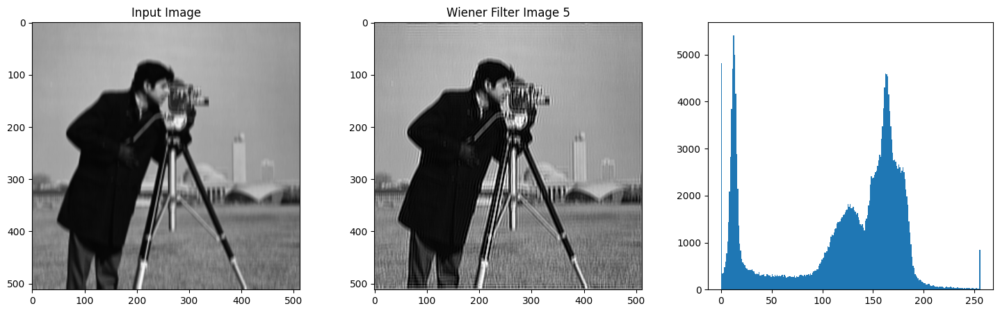

PSNR:  20.651819035816132
SSIM:  0.9245863845529044
ME:  0.9900550842285156
RAE:  0.0183868408203125


In [39]:
for x in range(len(linear_blur_images)):
    wiener_filter_image = wiener_filter(linear_blur_images[x])
    plot_images(linear_blur_images[x], wiener_filter_image, "Input Image", "Wiener Filter Image {}".format(x))
    evaluation(linear_blur_images[x], wiener_filter_image)

#### Built-in Implementation

In [40]:
def wiener_filter_cv2(img):
    kernel = cv2.getGaussianKernel(ksize=5, sigma=0.0000001)
    img_filtered = cv2.filter2D(img, ddepth=-1, kernel=kernel)
    return img_filtered

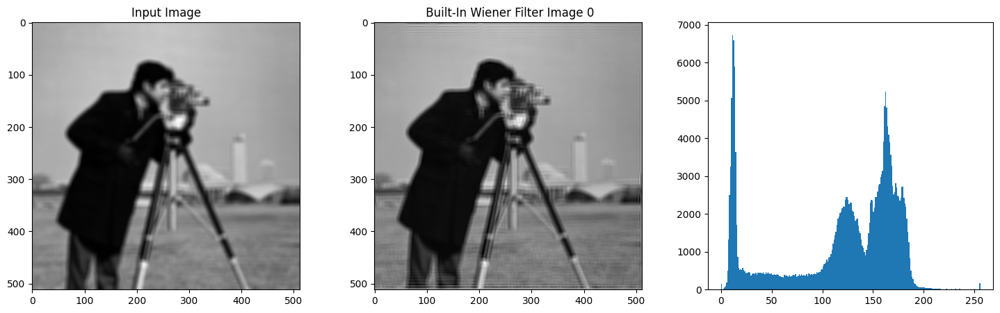

PSNR:  5.421032800014967
SSIM:  0.9807357201090385
ME:  0.823883056640625
RAE:  0.00060272216796875


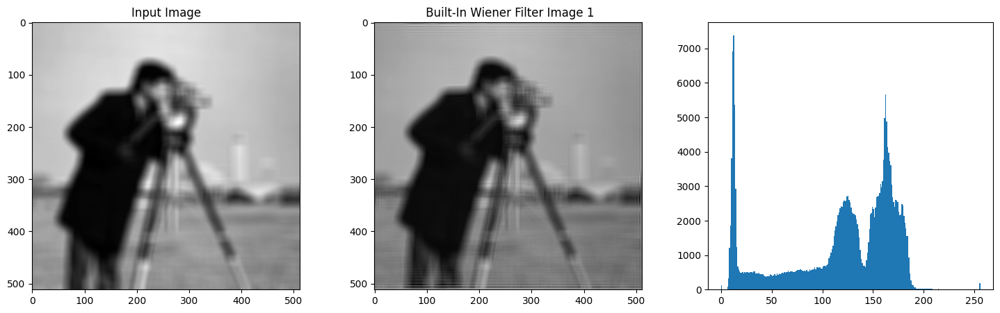

PSNR:  5.578729302788351
SSIM:  0.9886104103162988
ME:  0.8101539611816406
RAE:  0.0005035400390625


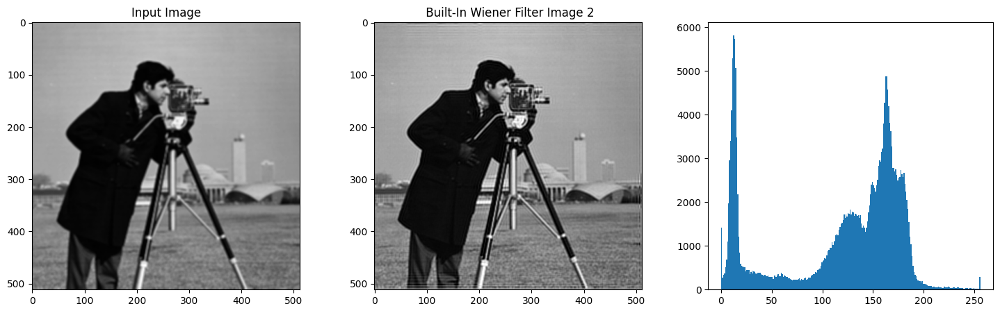

PSNR:  22.121403264228906
SSIM:  0.9462876158461052
ME:  0.8734474182128906
RAE:  0.005428314208984375


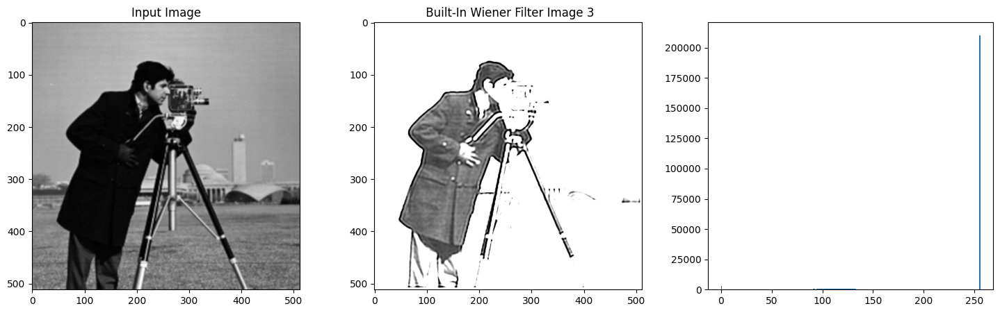

PSNR:  -11.677727796556523
SSIM:  0.07087236876869485
ME:  0.99517822265625
RAE:  0.0117034912109375


In [41]:
for x in range(len(box_filter_images)):
    wiener_filter_image = wiener_filter(box_filter_images[x])
    plot_images(box_filter_images[x], wiener_filter_image, "Input Image", " Built-In Wiener Filter Image {}".format(x))
    evaluation(box_filter_images[x], wiener_filter_image)

## Van-Cittert

In [4]:
def van_cittert_filter_cv2(img, iterations = 9, lambd = 0.1):
    h, w = img.shape
    u = np.zeros((h, w), dtype=np.float32)
    for i in range(iterations):
        laplacian = cv2.Laplacian(u, cv2.CV_32F, ksize=3)
        u = u + lambd*(img - laplacian)
    return u

In [5]:
image.min(), image.max()

(0, 255)

In [6]:
vc = van_cittert_filter_cv2(image)


vc.min(), vc.max()

(-2164.8877, 2766.1948)

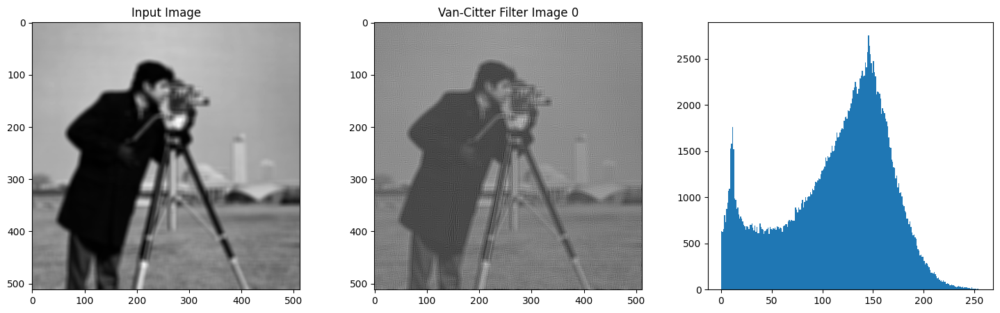

PSNR:  18.155835051752675
SSIM:  0.8716191007587273
ME:  1.0
RAE:  0.05749505734911152


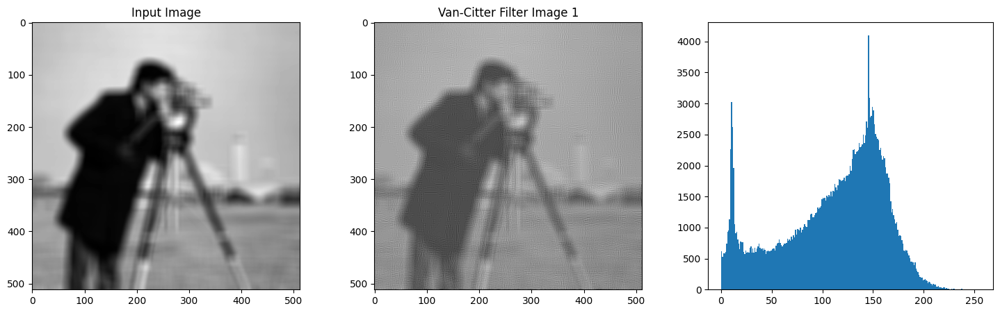

PSNR:  19.330893917083994
SSIM:  0.893529181042669
ME:  1.0
RAE:  0.03639981138939951


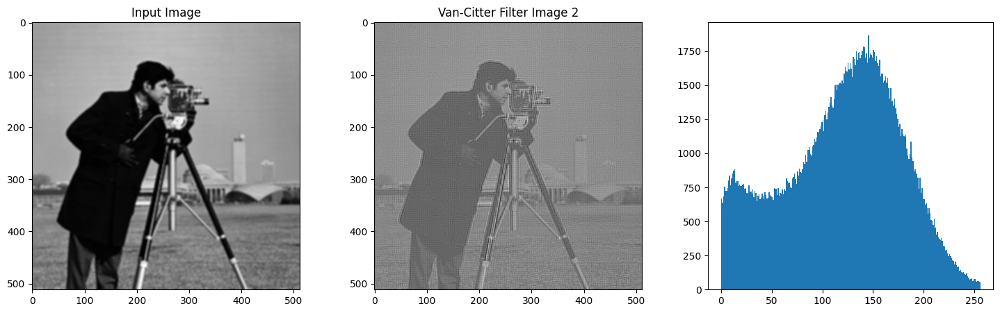

PSNR:  14.845310632099881
SSIM:  0.7680314913270926
ME:  1.0
RAE:  0.091484099743413


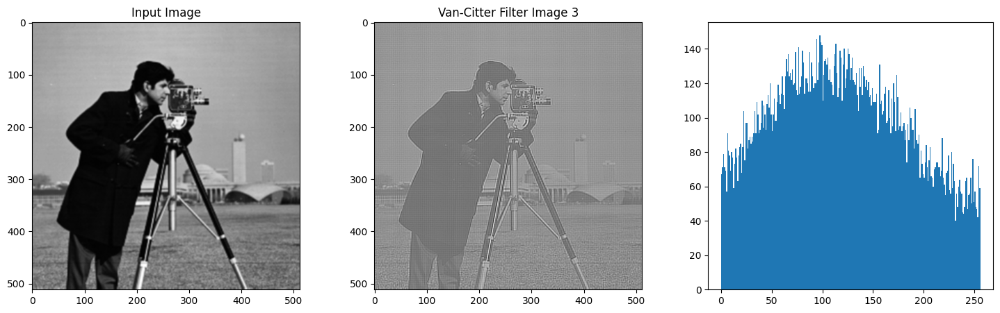

PSNR:  -5.643363265888272
SSIM:  0.7188276237577457
ME:  1.0
RAE:  0.09831992


In [44]:
for x in range(len(box_filter_images)):
    van_cittert_filter_image = van_cittert_filter_cv2(box_filter_images[x])
    plot_images(box_filter_images[x], van_cittert_filter_image, "Input Image", "Van-Citter Filter Image {}".format(x))
    evaluation(box_filter_images[x], van_cittert_filter_image)

## Richardson Lucy

In [45]:
linear_blur_images[0].min(), linear_blur_images[0].max()

(3.6363636363636362, 251.8181818181818)

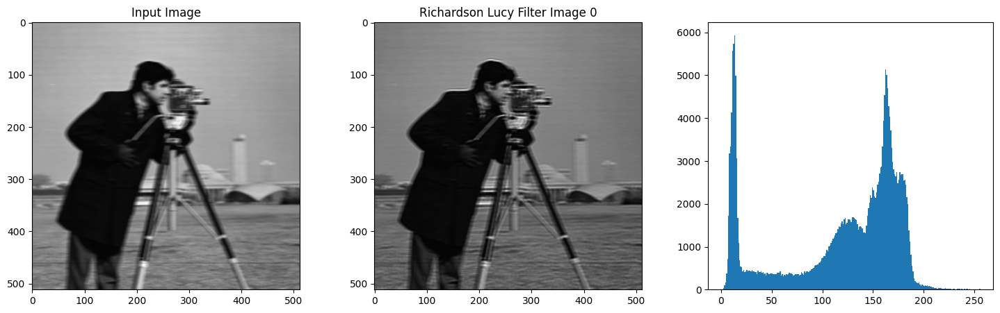

PSNR:  31.589174340188304
SSIM:  0.9936218562791578
ME:  1.0
RAE:  0.0


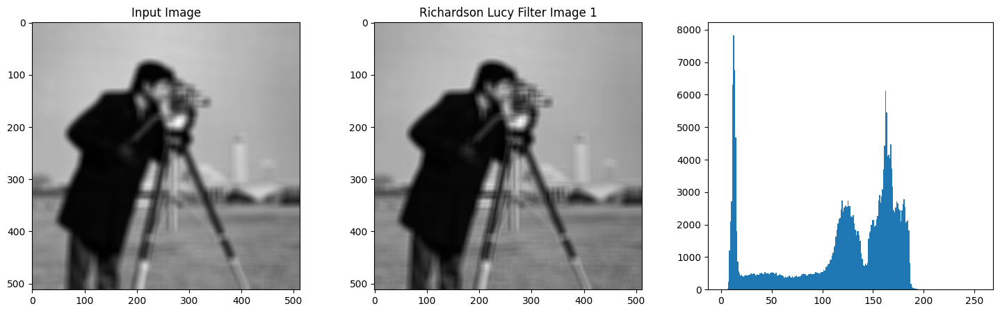

PSNR:  47.36574719039497
SSIM:  0.9998124606769009
ME:  1.0
RAE:  0.0


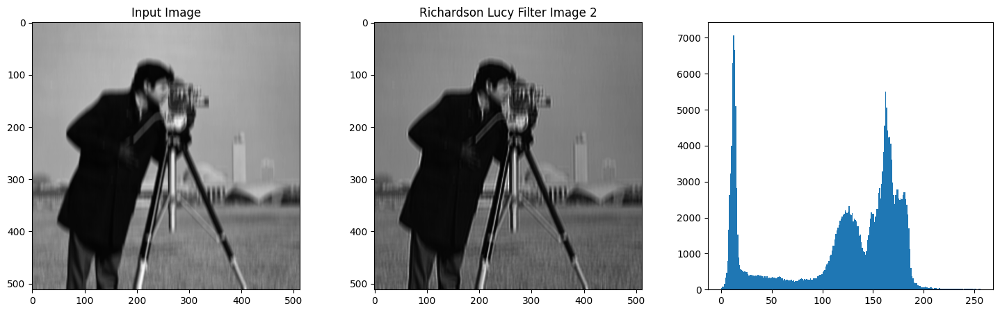

PSNR:  30.293373741566434
SSIM:  0.9914968753358343
ME:  1.0
RAE:  0.0


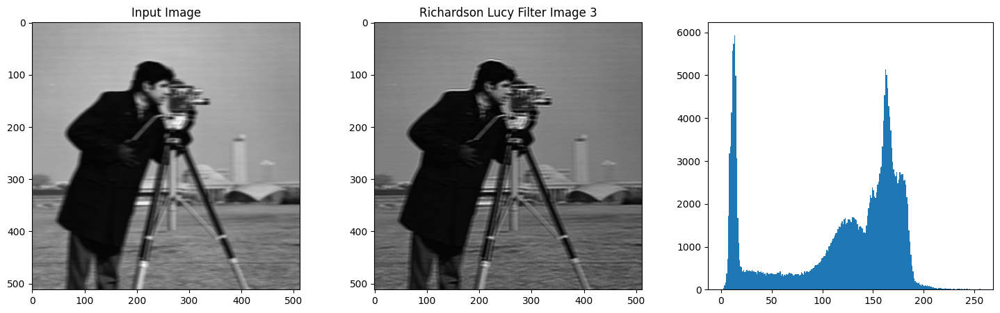

PSNR:  31.589174340188304
SSIM:  0.9936218562791578
ME:  1.0
RAE:  0.0


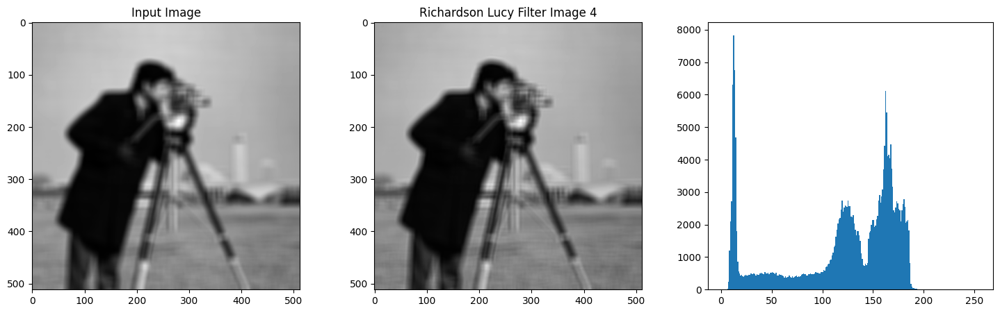

PSNR:  47.36574719039497
SSIM:  0.9998124606769009
ME:  1.0
RAE:  0.0


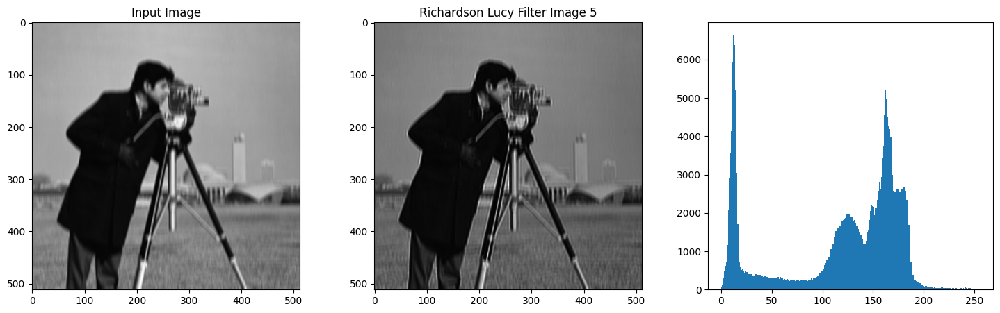

PSNR:  28.8858965347505
SSIM:  0.9886587257762782
ME:  1.0
RAE:  0.0


In [46]:
for x in range(len(linear_blur_images)):
    richardson_lucy_filter_image = richardson_lucy_filter(linear_blur_images[x], psf, 10)
    plot_images(linear_blur_images[x], richardson_lucy_filter_image, "Input Image", "Richardson Lucy Filter Image {}".format(x))
    evaluation(linear_blur_images[x], richardson_lucy_filter_image)

## Landweber

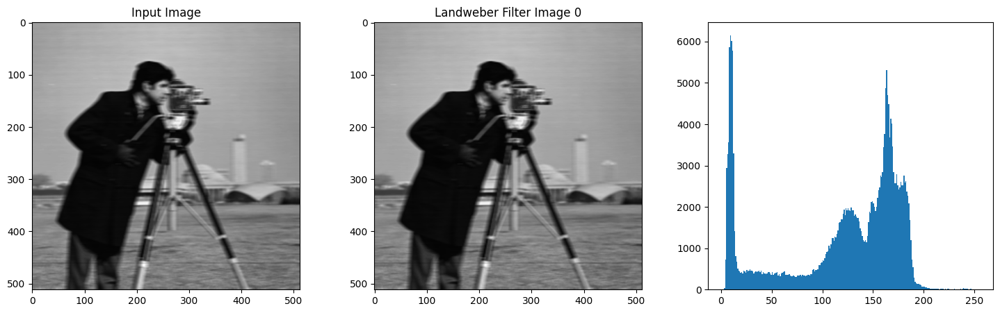

PSNR:  43.64074798458685
SSIM:  0.9996863484603937
ME:  0.9604148864746094
RAE:  2.6702880859375e-05


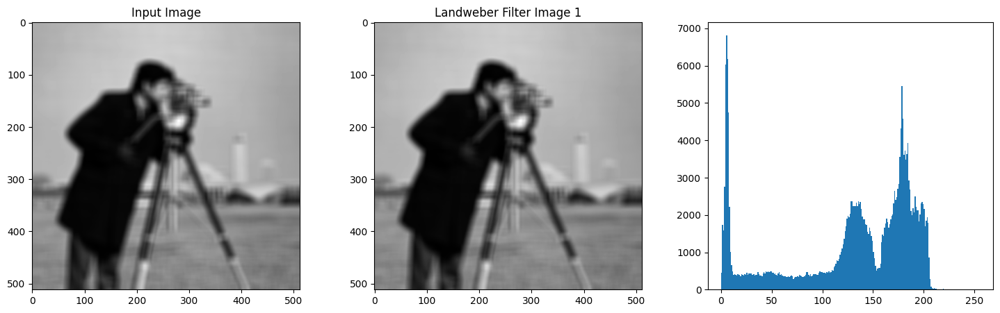

PSNR:  26.459558492506837
SSIM:  0.9876211298972344
ME:  0.999969482421875
RAE:  0.001743316650390625


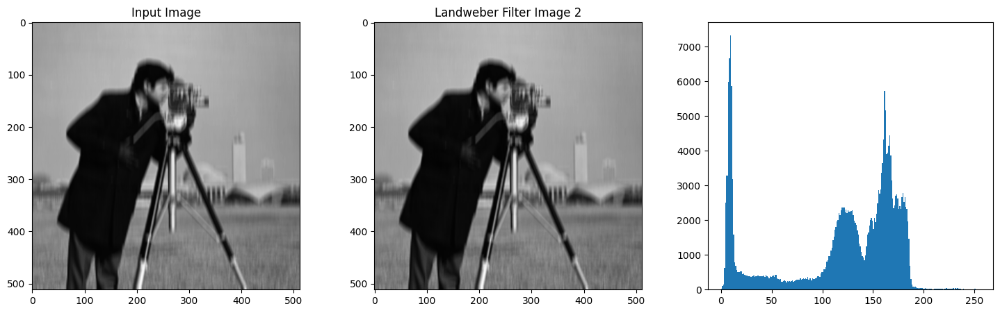

PSNR:  39.84849714190169
SSIM:  0.9996092205362993
ME:  0.9996986389160156
RAE:  0.00011444091796875


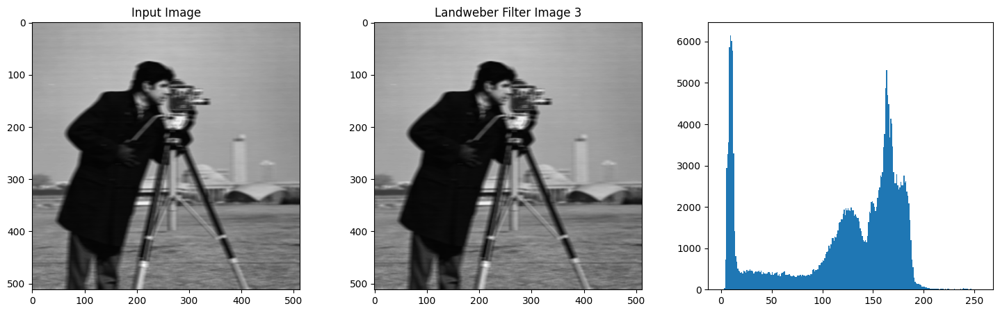

PSNR:  43.64074798458685
SSIM:  0.9996863484603937
ME:  0.9604148864746094
RAE:  2.6702880859375e-05


KeyboardInterrupt: 

In [47]:
for x in range(len(linear_blur_images)):
    landweber_filter_image = landweber(linear_blur_images[x],psf, n_iter=20, alpha=0.001)
    plot_images(linear_blur_images[x], landweber_filter_image, "Input Image", "Landweber Filter Image {}".format(x))
    evaluation(linear_blur_images[x], landweber_filter_image)